# Astrostats Final Project

Markus Leschly
Spring 2021

### Main Question: Do crater eccentricities vary by latitude?

In [9]:
import pandas as pd
#Import the CSV into a pandas dataframe

craters = pd.read_csv(r'./AstroStats_Robbins_Moon.csv')
print(craters)

       Unnamed: 0    CRATER_ID  LAT_CIRC_IMG  LON_CIRC_IMG  LAT_ELLI_IMG  \
0               0  00-1-000000     -19.83040      264.7570     -19.89050   
1               1  00-1-000001      44.77630      328.6020      44.40830   
2               2  00-1-000002      57.08660       82.0995      56.90000   
3               3  00-1-000003       1.96124      230.6220       1.95072   
4               4  00-1-000004     -49.14960      266.3470     -49.18330   
...           ...          ...           ...           ...           ...   
83056     1296791  10-2-014997     -65.62580      203.5000     -65.62160   
83057     1296792  10-3-000000     -60.02960      178.7090     -60.03010   
83058     1296793  10-3-000003     -66.79210      219.3790     -66.79510   
83059     1296794  10-3-000004     -79.83740       62.1794     -79.84080   
83060     1296795  10-3-000005     -79.68550       61.9220     -79.70550   

       LON_ELLI_IMG  DIAM_CIRC_IMG  DIAM_CIRC_SD_IMG  DIAM_ELLI_MAJOR_IMG  \
0         

The categories I really care about are LAT_ELLI_IMG, DIAM_ELLI_ECCEN_IMG

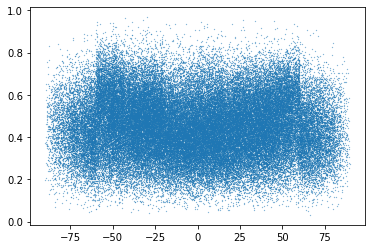

In [15]:
import matplotlib.pyplot as plt

latitude = craters['LAT_ELLI_IMG']
eccentricity = craters['DIAM_ELLI_ECCEN_IMG']

plt.scatter(latitude,eccentricity,0.05)

Woah, now that's a pretty interesting pattern. There is some from of a wall/dropoff/ridge at ~60 degrees latitude. Going to check in the paper if there is anything interesting about that latitude.

Interesting. Robbins notes that he uses the following projection methods for the following latitudes:

<|35 degrees|: Equidistant Cylindrical

+- 35-60 degrees: Molleweide with a local prime meridian

=>|60 degrees|: Polar stereographic.


He states that all projection effects were removed in later steps, but this seems to indicate that something happens when he switches to Polar stereographic.

Another interesting thing that happens at 60 degrees latitude is that the TC DTM and LOLA mosaic are no longer availble, though it seems unlikely to me that this would explain the sharp dropoff in eccentricities.

Some of these eccentricities do seem high (with the highest being 0.967617). This is also surprising since the eccentricity of a ellipse cannot be greater than 1 before becoming a parabola. When looking at the actual measurements for the crater, the major axis is ~21km and the minor is ~5km.  

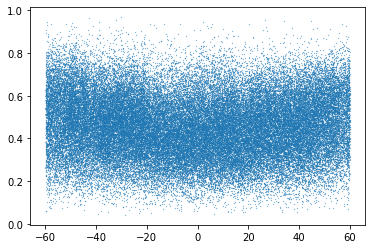

In [17]:
#Plotting data from 0-|60| degrees
craters_below_60_lat = craters[(craters['LAT_ELLI_IMG'] >= -60) & (df['LAT_ELLI_IMG'] <= 60)]

lat_less_60 = craters_below_60_lat['LAT_ELLI_IMG']
ecc_less_60 = craters_below_60_lat['DIAM_ELLI_ECCEN_IMG']

plt.scatter(lat_less_60,ecc_less_60,0.05)

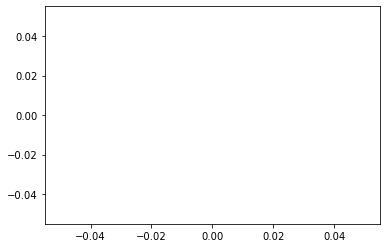

In [18]:
#Plotting data from >|60| degrees
craters_above_60_lat = craters[(craters['LAT_ELLI_IMG'] < -60) & (df['LAT_ELLI_IMG'] > 60)]

lat_over_60 = craters_above_60_lat['LAT_ELLI_IMG']
ecc_over_60 = craters_above_60_lat['DIAM_ELLI_ECCEN_IMG']

plt.scatter(lat_over_60,ecc_over_60,0.05)